# Geo Plot
---

## 00. Imports

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from datetime import datetime
from tqdm import tqdm_notebook

%matplotlib inline

## 01. Settings

In [3]:
BG_COLOR = "black"
FILL_COLOR = "gray"

TS_CONFIRMED = "../data/hopkins/time_series-ncov-Confirmed.csv"
COLUMN_NAMES = [
    "Province/State",
    "Country/Region",
    "Lat",
    "Long",
    "Date",
    "Value"
]

TARGET_DIR = "../viz/geo"

## 02. Plotting function

In [4]:
def format_cases(val: int) -> str:
    val_k = int(val / 1000)
    return "{}K".format(val_k)

In [5]:
def draw_geo_plot(lat: np.array, lon: np.array, val: np.array, title: str, sub_title: str, fig_size=(16,20), path: str = None) -> None:
    total_cases = val.sum()
    fig = plt.figure(figsize=fig_size)
    plt.style.use('dark_background')
    plt.annotate(sub_title, xy=(0.025, 0.08), xycoords='axes fraction', color="white", fontsize=16)
    
    m = Basemap(projection='mill',llcrnrlat=-60,urcrnrlat=85,
                llcrnrlon=-180,urcrnrlon=180,resolution='c')
    
    m.drawmapboundary(color=BG_COLOR, linewidth=0.0, fill_color=BG_COLOR)
    m.fillcontinents(FILL_COLOR, lake_color=BG_COLOR)
    m.drawcountries(linewidth=0.5, linestyle='solid', color=BG_COLOR, zorder=30)
    
    x1, y1 = m(lon, lat)
    m.scatter(x1, y1, s=val*0.03, marker="o", color="red", zorder=10, 
              alpha=0.7, edgecolors="white")
    
    plt.title(title, fontsize=24, y=1.05)
    
    if path is not None:
        plt.savefig(path, bbox_inches="tight")
    else:
        plt.show()

In [6]:
def make_plot_with_data(df: pd.DataFrame, date: str, path: str = None) -> None:
    df_day = df[df["Date"] == date]
    lat = np.squeeze(df_day[["Lat"]].to_numpy())
    lon = np.squeeze(df_day[["Long"]].to_numpy())
    val = np.squeeze(df_day[["Value"]].to_numpy())
    title = "COVID-19 CONFIRMED CASES"
    sub_title = datetime.strftime(datetime.strptime(date, "%Y-%m-%d"), "%b %d %Y")
    draw_geo_plot(lat=lat, lon=lon, val=val, title=title, sub_title=sub_title, path=path)

## 03. Load data

In [7]:
df = pd.read_csv(TS_CONFIRMED, skiprows=2, names=COLUMN_NAMES)
df.head()

,Province/State,Country/Region,Lat,Long,Date,Value
0,NaN,Afghanistan,33.0,65.0,2020-03-22,40
1,NaN,Afghanistan,33.0,65.0,2020-03-21,24
2,NaN,Afghanistan,33.0,65.0,2020-03-20,24
3,NaN,Afghanistan,33.0,65.0,2020-03-19,22
4,NaN,Afghanistan,33.0,65.0,2020-03-18,22


## 04. Make plot

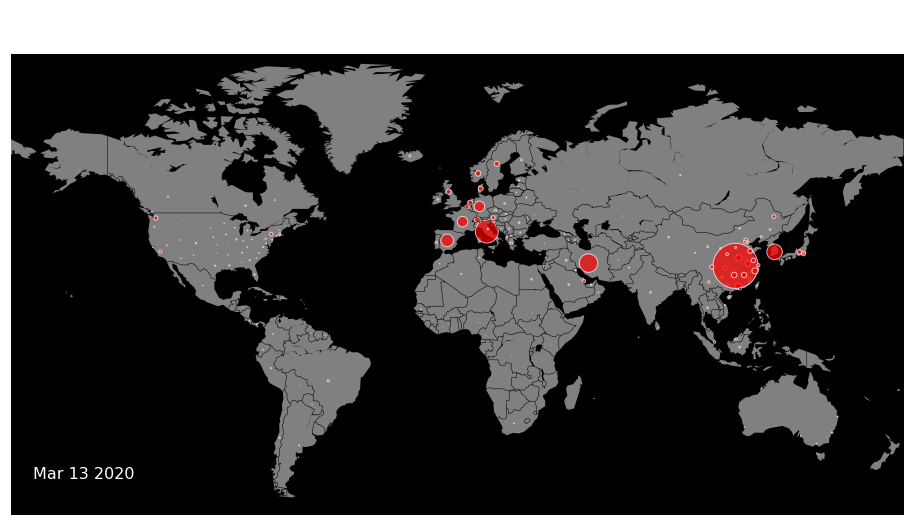

In [8]:
make_plot_with_data(df, "2020-03-13")

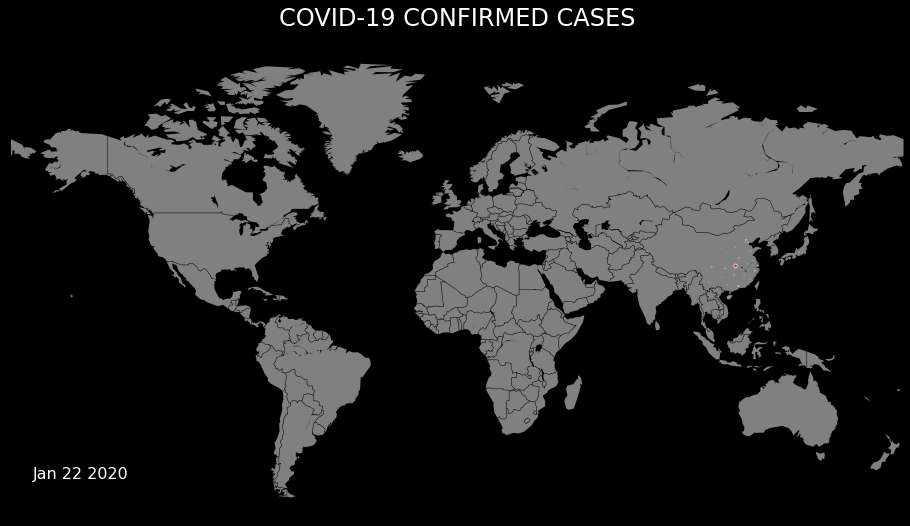

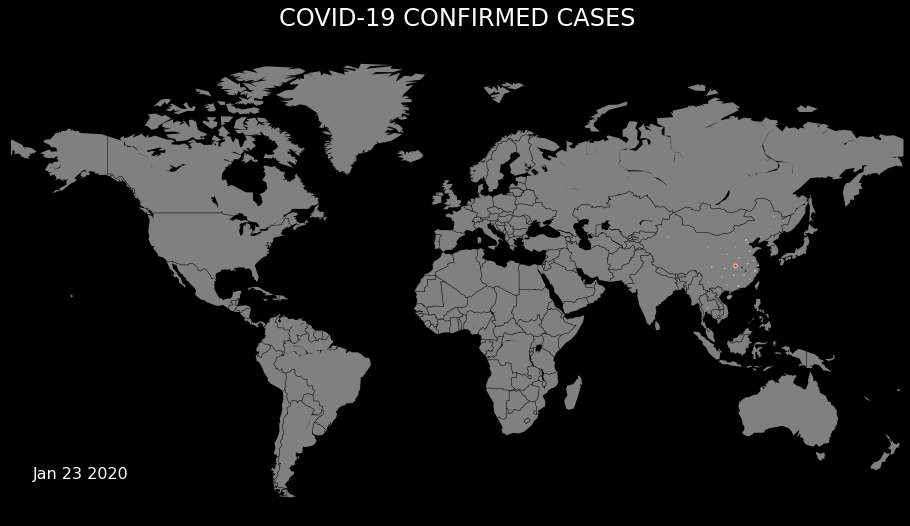

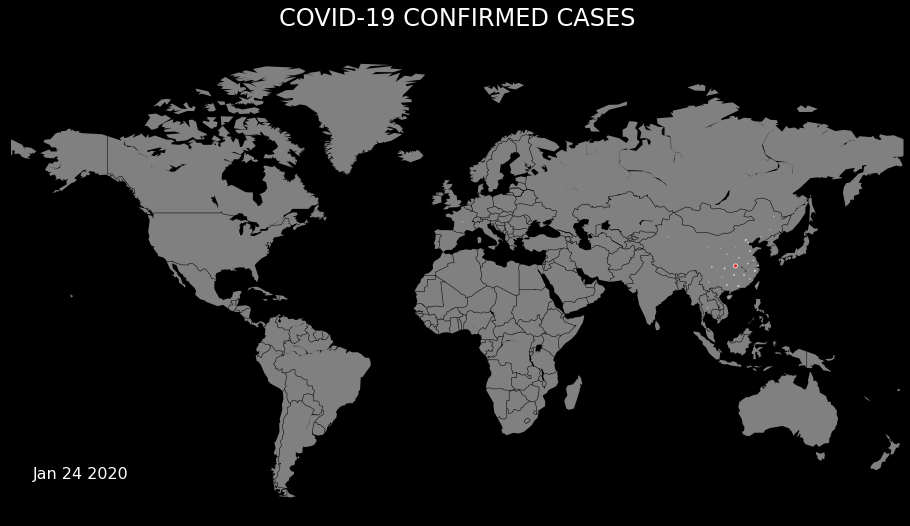

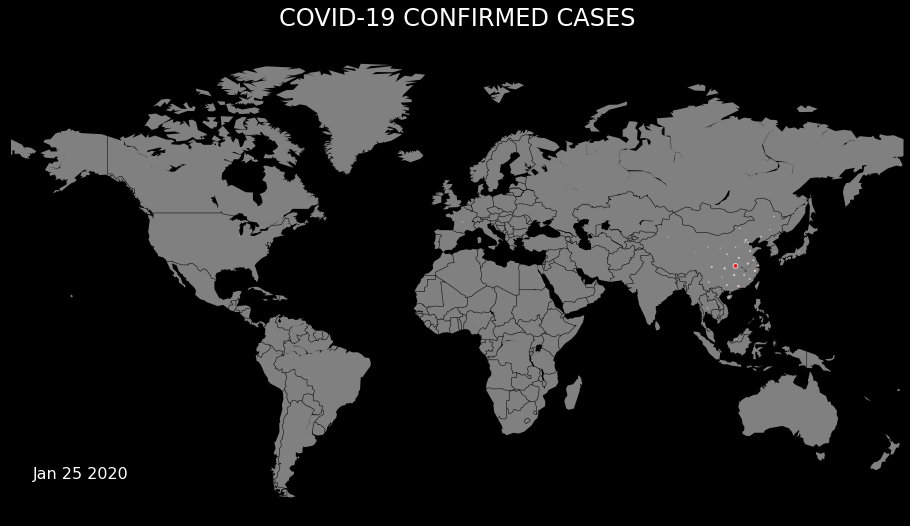

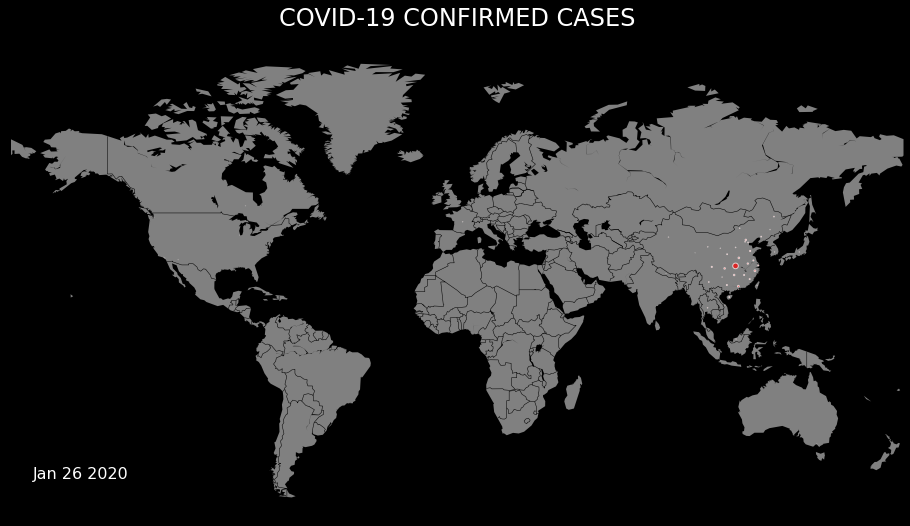

...

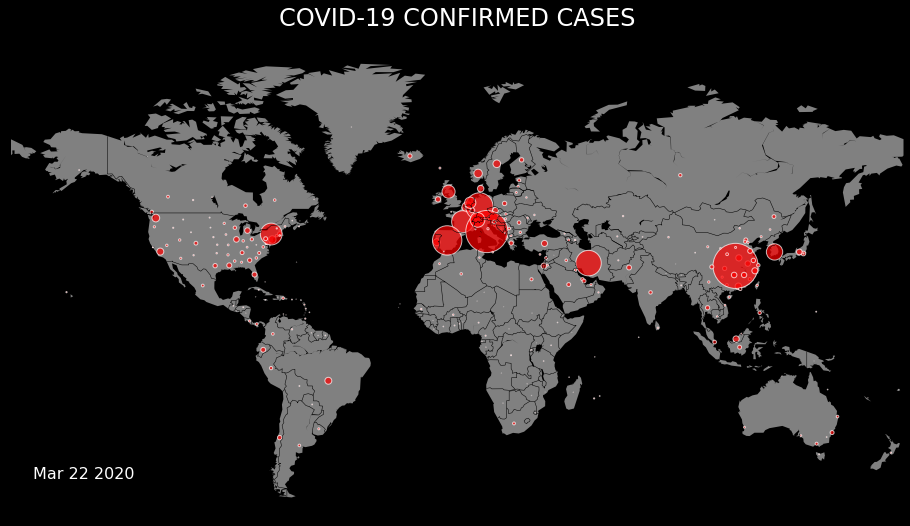

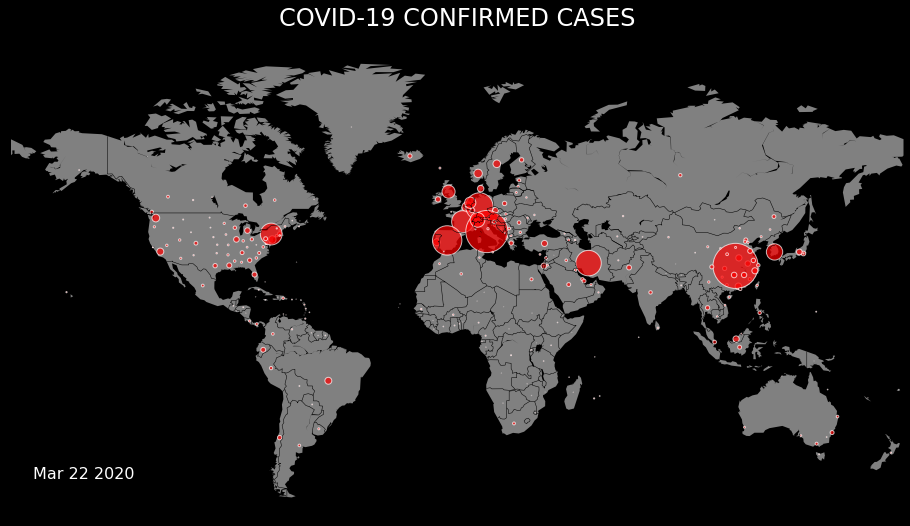

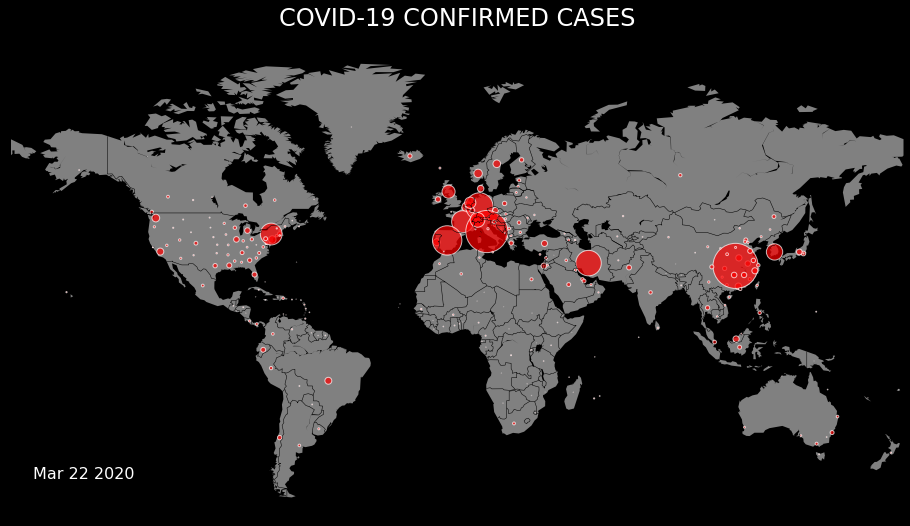

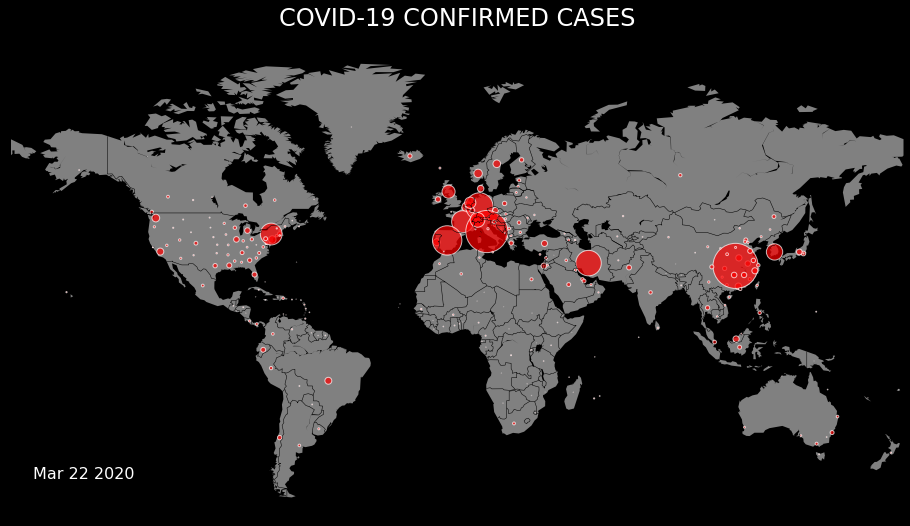

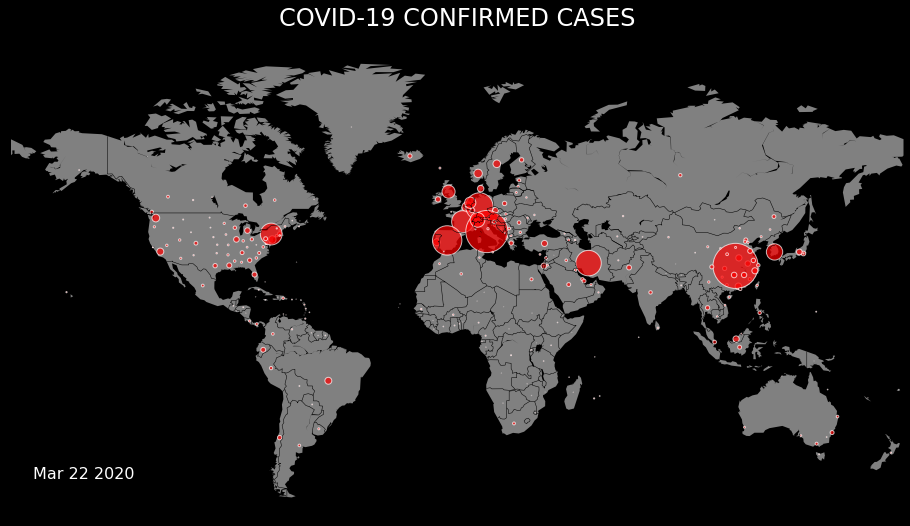

In [9]:
dates = np.sort(df["Date"].unique())

# plot all days
for idx, date in tqdm_notebook(enumerate(dates)):
    file_name = "{:03}.png".format(idx)
    file_path = os.path.join(TARGET_DIR, file_name)
    make_plot_with_data(df, date, file_path)
    
# plot last day few times
date = dates[-1]
for idx in range(len(dates), len(dates) + 10):
    file_name = "{:03}.png".format(idx)
    file_path = os.path.join(TARGET_DIR, file_name)
    make_plot_with_data(df, date, file_path)